# Numerical simulation of the wave equation in 2D using Finite Difference

## Import libraries

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys

----

## Create domain model properties (i.e. speed of waves), and discretisation grid

In [2]:
# 500 gridpoints along the x-axis, 350 along the z-axis
nx = 500
nz = 350


# start with homogeneous model - same wave-speed everywhere.
c = np.full((nx,nz),1500.0)  # Note: 1500m/s is typical acoustic velocity of water


# a faster layer, deeper in model, to show reflection of waves when crossing sharp interface
c[:,140:] = 2500.0  # Note: 2500m/s is fairly typical acoustic velocity of sedimentary rock


# create a gradient from 1750m/s (at cell-depth 110) to 3340m/s down to start of bottom absorbing layer
for iz in range(110,nz-80):
    c[:,iz] = 1750.0+(iz-110)*10.0
# fill down the rest of the model with last speed from above...
# (don't bother carrying on the gradient to the bottom, since that just leads to higher max speed, and that in turn
# makes the best time-step smaller, hence more steps, and it makes the bottom absorbing layer less effective)
c[:,nz-80:] = c[0,nz-81]


# small square to show diffraction
c[220:230,130:140]=3500.0


print('Speed at bottom of domain is %.1fm/s' % (c[100,-1]))
print('Range of speeds:  %.1fm/s to %.1fm/s' % (c.min(),c.max()))

Speed at bottom of domain is 3340.0m/s
Range of speeds:  1500.0m/s to 3500.0m/s


In [3]:
length = 3500.0 # assign a length to the model in metres

dx = length/nx # calculate the spatial increment between model parameters

depth = dx*nz # calculate the depth from the length and number of x and z gridpoints

print('Domain is %d x %d grid-cells (%.1fm x %.1fm)' % (nx,nz,length,depth))
print('Grid-spacing (dx) is %.2fm' % (dx))

Domain is 500 x 350 grid-cells (3500.0m x 2450.0m)
Grid-spacing (dx) is 7.00m


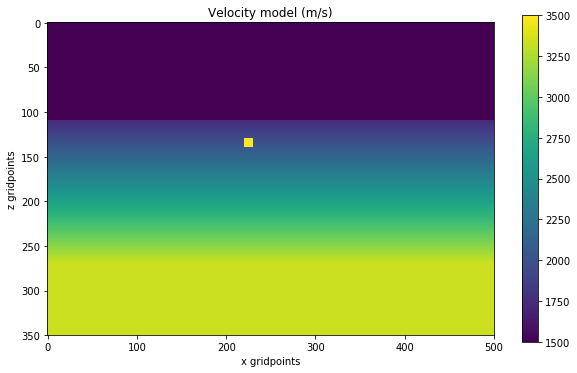

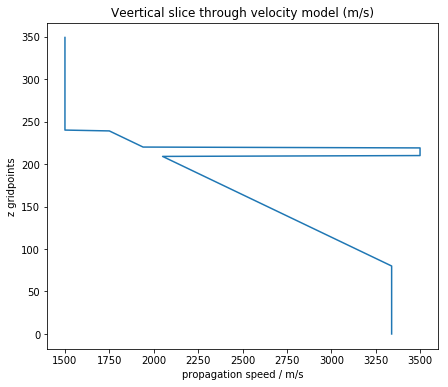

In [31]:
plt.figure(figsize=(10,6))
plt.imshow(c.T) # plotting the velocity model (note transposed, to orient plot in way we expect)
plt.colorbar()
plt.xlabel('x gridpoints')
plt.ylabel('z gridpoints')
plt.title('Velocity model (m/s)')
plt.show()

plt.figure(figsize=(7,6))
plt.plot(c[225,:],range(nz-1,-1,-1))  # note two arrays, 2nd one (range) gets model on x axis
plt.xlabel('propagation speed / m/s')
plt.ylabel('z gridpoints')
plt.title('Veertical slice through velocity model (m/s)')
plt.show()

----
## Modelling constraints
#### CFL stability condition should be satisfied – the 'Courant number'.

The dimensionless Courant number, $C$, gives a measure of how far a signal will travel across a grid-cell (/between grid-points) within one time-step.
(Hence why I will very often refer to it as 'the crossing factor'.)

The crossing factor is $c$.$\delta t$/$\delta x$ for speed $c$, and we want the maximum value of this within the whole domain to satisfy some constraint that depends upon the finite-difference stencil(s) in use when modelling.

i.e. we want:$\quad \text{max}(c)$.$\delta t/\delta x <= C_{max}$, where $\ C_{max}$ depends on the discretisations.

We can turn this around to find the maximum time-step for our model and grid-spacing, given $C_{max}$ for our discretisations:

$$\delta t_{best} = \frac{C_{max}\ \delta x}{\text{max}(c)}$$

#### This spatial stencil (simple 2nd order), with 2nd-order time-stepping, requires the max crossing factor to (usually) be no more than ~sqrt(2)
(i.e. can only cross up to 70.7% of a cell in one time-step – we'll use 70% here...)

In [5]:
courant = 0.70  # set the dimensionless max Courant number for 2nd-order FD grid in space & time

In [6]:
time = 2.0  # desired length of the simulation in seconds
dt = (courant*dx)/c.max()  # define the best time-step by using the max Courant number
nt = int(time/dt+0.9999)  # how many steps are needed to cover that time
time = nt*dt  # turn that back into exact time for this number of steps
print('Time-step = %.5fs  Number of steps = %d  (Total time being modelled: %.5fs)' % (dt,nt,dt*nt))

Time-step = 0.00140s  Number of steps = 1429  (Total time being modelled: 2.00060s)


### Create source function (Ricker wavelet with 8Hz peak frequency)

The Ricker wavelet used here is a function of time that's defined from the second derivate of a Gaussian function (which is $G(t)=\text{e}^{-a^2 t^2}$).

–It's also known as the Mexican hat wavelet, due to its shape when plotted as a function of two variables.

It can be written so it is symmetric about time zero, with maximum at that time, ultimately decaying towards zero as $t$$\rightarrow$$±\infty$. However, we will shift it in time so that it starts near zero at our time zero.

After differentiating above Gaussian, $G(t)$, twice, flipping, then scaling (and before shifting in time), we get: $\quad R(t) = (1-2a^2 t^2)\ \text{e}^{-a^2 t^2}$

The peak frequency of the Ricker wavelet is at $f$=$a/\pi$.

The length of the wavelet, in time, before it decays close enough to zero for our purposes, is about $\frac{2.1}{f}$ (i.e. about $\frac{1.05}{f}$ seconds each side of the wavelet's central peak).

In [7]:
amp = 1.0  # amplitude of the source wavelet 
freq = 8.0  # peak frequency of source wavelet
ts = 2.1/freq  # desired length of wavelet in time is related to peak frequency
ns = int(ts/dt+0.9999) # figure out how many time-steps are needed to cover that time
ts = ns*dt # and now turn that back into a time that's exactly the required number of steps
print('Length of wavelet will be %.3f secs (%d steps)' % (ts,ns))

Length of wavelet will be 0.263 secs (188 steps)


In [8]:
a2 = (freq*np.pi)**2  # a squared (see equation above)
t0 = ts/2 - dt/2  # midpoint time of wavelet
src = np.zeros(ns)
# create Ricker wavelet (see equation above), offset by time t0 (so midpoint of wavelet is at time t=t0)
for i in range(ns):
    src[i] = amp*( (1 - 2*a2*((i*dt-t0)**2)) * np.exp(-a2*((i*dt-t0)**2)) )
    #src[i] = amp*np.sin((0.5+i)*np.pi/ns)**2  # uncomment to make sine-squared 'bump' instead (not 7Hz peak tho')
print('Endpoint values are: %.6f %.6f' % (src[0],src[-1]))

Endpoint values are: -0.000411 -0.000411


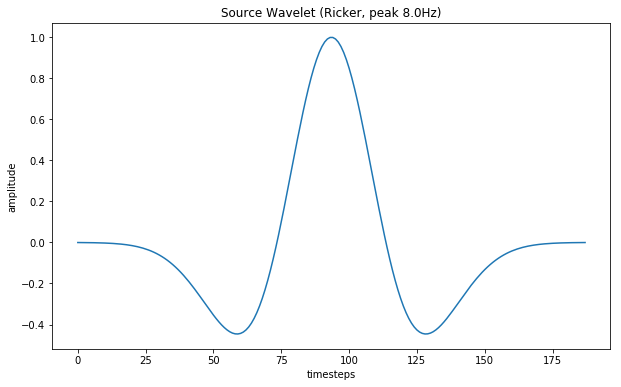

In [9]:
plt.figure(figsize=(10,6))
plt.plot(src) # plot source wavelet
plt.xlabel('timesteps')
plt.ylabel('amplitude')
plt.title('Source Wavelet (Ricker, peak %.1fHz)' % (freq))
plt.show()

### Check that the maximum frequency in the source wavelet can propagate reliably

For a simple second-order finite-difference, the minimum wavelength of a signal that we can propagate reliably is about 10 cells.

In [10]:
min_cells_per_wl = 10.0  # minimum of 10 cells per wavelength for reasonably accurate propagation
max_freq = c.min()/(min_cells_per_wl*dx) # calculate the max frequency that can be modelled without numerical dispersion
print('Maximum reliable propagation frequency is about %.1fHz' % max_freq)

Maximum reliable propagation frequency is about 21.4Hz


#### Want to avoid causing too much dispersion by keeping maximum significant frequency within this limit...

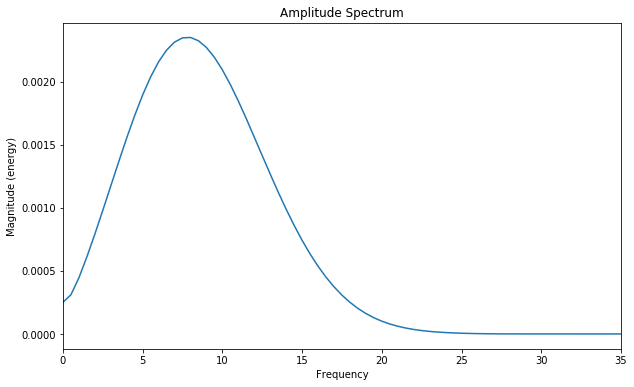

In [11]:
# plot amplitude spectrum of source wavelet
plt.figure(figsize=(10,6))
plt.magnitude_spectrum(np.append(src,np.zeros(nt-ns)), Fs=1/dt)  # note padding to nt points
plt.title('Amplitude Spectrum')
plt.xlim(0,35)
plt.show()

In [12]:
# want to locate the source in the grid
sx = 150
sz = 80

----
## Create model for absorbing boundary layers

In [13]:
# want layer around all edges of the model to be 60 cells thick
abswid = 60

Choose one of the following three absorbing models to try (can comment out other two, if desired...)

In [14]:
# CONSTANT

a = np.zeros((nx,nz))  # initialise array with zeros

a[:abswid,:]  = 1.0  # left layer
a[-abswid:,:] = 1.0  # right layer

a[:,:abswid]  = 1.0  # top layer
a[:,-abswid:] = 1.0  # bottom layer

a[:,-70:]  = 1.0  # uncomment to make bottom layer 70 cells instead of 60

absfact = 0.04

In [15]:
# LINEAR

a = np.zeros((nx,nz))  # initialise array with zeros

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i,:]   = 1.0*i/abswid  # linear increase towards left boundary
    a[i-abswid-1,:] = 1.0*i/abswid  # linear increase towards right boundary

# top and bottom absorbing layers
for i in range(1,abswid+1):  # sixty cells in layer
    for j in range(nx):
        a[j,abswid-i]   = max(a[j,abswid-i],   1.0*i/abswid) # linear increase towards top boundary
        a[j,i-abswid-1] = max(a[j,i-abswid-1], 1.0*i/abswid) # linear increase towards bottom boundary

# uncomment below to make bottom layer 80 cells instead of 60...
for i in range(1,81):  # try 80 cells in bottom layer
    for j in range(nx):
        a[j,i-81]   = max(a[j,i-81], 1.0*i/80)  # linear increase towards bottom boundary

#absfact = 0.08  # without predictive boundary
absfact = 0.04  # with predictive boundary

In [43]:
# QUADRATIC

a = np.zeros((nx,nz))  # initialise array with zeros

absw2 = abswid*abswid  # useful shorthand

# left and right absorbing layers
for i in range(1,abswid+1):  # sixty cells in layers
    a[abswid-i,:]   = 1.0*i*i/absw2  # quadratic increase towards left boundary
    a[i-abswid-1,:] = 1.0*i*i/absw2  # quadratic increase towards right boundary

# top and bottom absorbing layers
for i in range(1,abswid+1):  # sixty cells in layer
    for j in range(nx):
        a[j,abswid-i]   = max(a[j,abswid-i],   1.0*i*i/absw2)  # quadratic increase towards top boundary
        a[j,i-abswid-1] = max(a[j,i-abswid-1], 1.0*i*i/absw2)  # quadratic increase towards bottom boundary


# uncomment below to make bottom layer 80 cells instead of 60...
for i in range(1,81):  # try 80 cells in bottom layer
    for j in range(nx):
        a[j,i-81]   = max(a[j,i-81], 1.0*i*i/(80*80))  # quadratic increase towards bottom boundary

        
#absfact = 0.1  # without predictive boundary
absfact = 0.04  # with predictive boundary

#### Show the absorption model

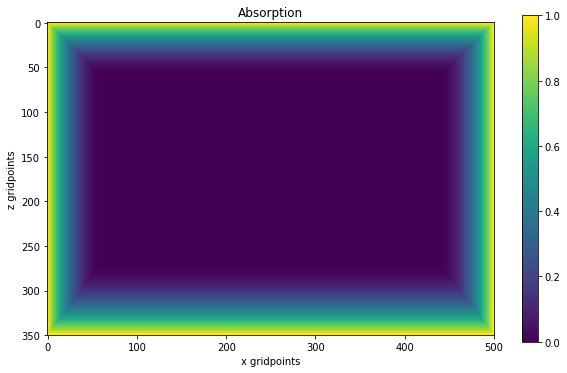

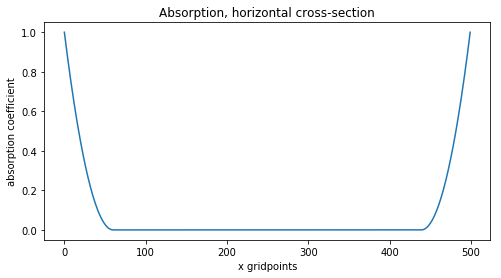

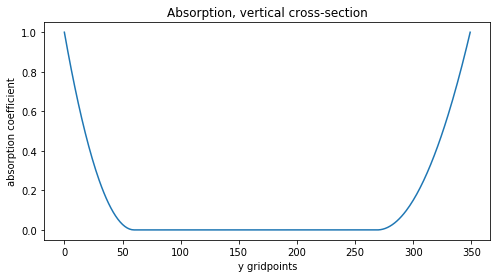

In [44]:
# various plots so you can check your absorption model...

plt.figure(figsize=(10,6))
plt.title('Absorption')

plt.imshow(a.T) # plotting the absorption as a 2d colour plot (note transposed, to orient plot in way we expect)
plt.colorbar()
plt.xlabel('x gridpoints')
plt.ylabel('z gridpoints')

plt.show()


plt.figure(figsize=(8,4))
plt.title('Absorption, horizontal cross-section')

plt.plot(a[:,200])  # horizontal cross-section through absorption, to show const/linear/quadratic nature
plt.xlabel('x gridpoints')
plt.ylabel('absorption coefficient')

plt.show()


plt.figure(figsize=(8,4))
plt.title('Absorption, vertical cross-section')

plt.plot(a[200,:])  # vertical cross-section through absorption, to show const/linear/quadratic nature
plt.xlabel('y gridpoints')
plt.ylabel('absorption coefficient')

plt.show()

Finish by scaling with velocity and other factors, for direct use in simulation later

In [45]:
#absfact = 0.0  # to switch off absorbing layer

a[:,:] = a[:,:]*c[:,:]*(dt/dx)*absfact

## Predictive boundary condition

In [46]:
# set up crossing-factor arrays for use at edges with 'predictive' boundary condition
C_zmin = c[:,0]*dt/dx   # along top edge
C_zmax = c[:,-1]*dt/dx  # along bottom edge
C_xmin = c[0,:]*dt/dx   # along left edge
C_xmax = c[-1,:]*dt/dx  # along right edge

# for use without absorbing layers:
predfact_zmin = 1.0
predfact_zmax = 1.0
predfact_xmin = 1.0
predfact_xmax = 1.0

# for use with absorbing layers:
predfact_zmin = 0.99
predfact_zmax = 0.98
predfact_xmin = 0.99
predfact_xmax = 0.99

# to switch off predictive boundaries:
#predfact_zmin = 0.0
#predfact_zmax = 0.0
#predfact_xmin = 0.0
#predfact_zmax = 0.0

## Line of receivers within domain
–To detect what crosses a particular horizontal line of the domain (i.e. constant depth) over time

In [47]:
rz = 70  # put receiver line at depth of seventy cells (just above source point)
r = np.zeros((nx,nt))  # an array to store receiver data every step (and to plot later)

----
# Simulation

In [48]:
# Initialise arrays for wavefields
u = np.zeros((nx,nz)) # current wavefield
u_prv = np.zeros((nx,nz)) # old t-1 wavefield
u_nxt = np.zeros((nx,nz)) # new t+1 wavefield

In [49]:
# prepare an array to store wavefield snapshots for plotting
sampling_rate = 10 # set sampling rate used to store wavefield (every 10 timesteps)
wavefield = np.zeros((int(nt/sampling_rate), nx, nz)) # array to store wavefields every 10 timesteps
print('Storing %d wavefields (every %dth out of %d)' % (wavefield.shape[0],sampling_rate,nt))

Storing 142 wavefields (every 10th out of 1429)


In [50]:
# a useful variable – shorthand for something that appears regularly in expressions below
dtdx2 = (dt*dt)/(dx*dx)

In [51]:
#u[:,0] = src[0]*0.1
u[sx,sz] = src[0] #*dtdx2*(c[sx,sz]**2) # inject first source entry into current wavefield

# begin time-stepping loop...

for i in range(nt):

    if (i+1)%20==0:  # show progress every 20 steps
        sys.stdout.write('Done step %d (of %d)\r' % (i+1,nt))

    # find new wavefield, u_new, throughout domain - **apart from edges**
    # NOTE: no vectorisation (i.e. v.slow), and no absorbing layers
    #for ix in range(1,nx-1):
    #    for iz in range(1,nz-1):
    #        u_new[ix,iz] = 2*u[ix,iz] - u_old[ix,iz] + (c[ix,iz]**2) * dtdx2 * \
    #                            (-4*u[ix,iz]+u[ix-1,iz]+u[ix+1,iz]+u[ix,iz-1]+u[ix,iz+1])

    # find new wavefield, u_new, throughout domain (apart from edges)
    # NOTE: uses vectorisation, so it's much faster!
    u_nxt[1:-1,1:-1] = ( (2-a[1:-1,1:-1]**2)*u[1:-1,1:-1] - u_prv[1:-1,1:-1]*(1-a[1:-1,1:-1]) \
                       + (c[1:-1,1:-1]**2) * dtdx2 * \
                            (-4*u[1:-1,1:-1]+u[:-2,1:-1]+u[2:,1:-1]+u[1:-1,:-2]+u[1:-1,2:]) ) \
                     / (1+a[1:-1,1:-1])
    
    # find u_new for top and bottom edges using 'predictive' boundary condition
    u_nxt[:,0] = (u[:,0]*(1.0-C_zmin[:]) + u[:,1]*C_zmin[:])*predfact_zmin
    u_nxt[:,-1] = (u[:,-1]*(1.0-C_zmax[:]) + u[:,-2]*C_zmax[:])*predfact_zmax

    # find u_new for left and right edges using 'predictive' boundary condition
    u_nxt[0,:] = (u[0,:]*(1.0-C_xmin[:]) + u[1,:]*C_xmin[:])*predfact_xmin
    u_nxt[-1,:] = (u[-1,:]*(1.0-C_xmax[:]) + u[-2,:]*C_xmax[:])*predfact_xmax

    # inject source on boundary, for plane wave with frequency freq
    #if i+1<ns:
    #    u_new[:,0] = src[i+1]*0.1 #np.sin(np.pi*i*dt*2*freq)*0.1
    # inject source entry for this step at the source point
    if i+1<ns:
        u_nxt[sx,sz] = src[i+1] #*dtdx2*(c[sx,sz]**2)
    
    # shift wavefields for next time-step
    u_prv[:,:] = u[:,:]
    u[:,:] = u_nxt[:,:]
    
    # fill in values at receivers
    r[:,i] = u[:,rz]

    if (i+1)%sampling_rate == 0: # store the current wavefield u on every tenth step
        wavefield[int((i+1)/sampling_rate-1)] = u[:,:]

print('Finished %d time-steps' % (nt))

Finished 1429 time-steps


## Plot wavefield at different times

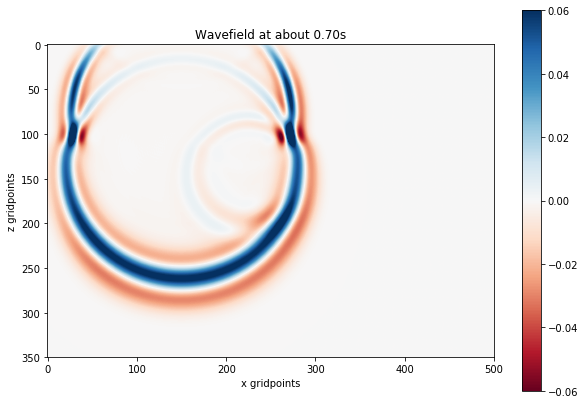

In [52]:
b=0.06 # bounds for plots will be -b to +b
plot_time = 0.7  # 0.7 seconds
plt.figure(figsize=(10,7))
plt.imshow(wavefield[int(plot_time/(dt*sampling_rate))].T,   # note the wavefield was transposed
           vmin=-b, vmax=b, cmap='RdBu', interpolation='bilinear')
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.colorbar()
plt.xlabel('x gridpoints')
plt.ylabel('z gridpoints')
plt.show()

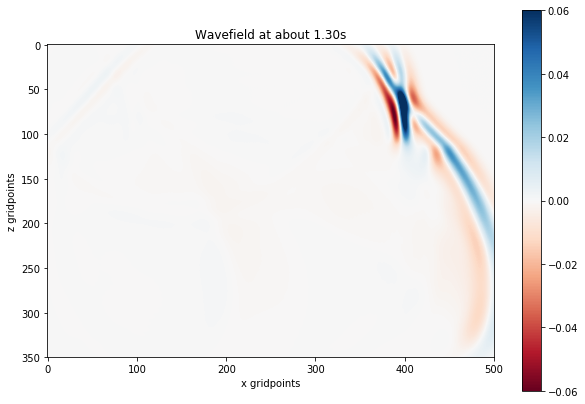

In [53]:
plot_time = 1.3  # 1.3 seconds
plt.figure(figsize=(10,7))
plt.imshow(wavefield[int(plot_time/(dt*sampling_rate))].T, vmin=-b, vmax=b, cmap='RdBu', interpolation='bilinear')
plt.title('Wavefield at about %.2fs' % (plot_time))
plt.colorbar()
plt.xlabel('x gridpoints')
plt.ylabel('z gridpoints')
plt.show()

## Plot data at receivers

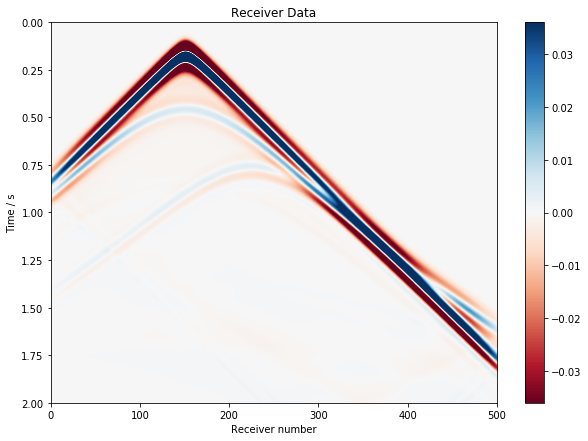

In [54]:
plt.figure(figsize=(10,7))
plt.imshow(r.T, cmap='RdBu', interpolation='bilinear', aspect='auto', 
           vmin=-b*0.6, vmax=b*0.6,   # set bounds for colourmap data
           extent=(0,nx,time,0))  # set bounds for axes
plt.title('Receiver Data')
plt.colorbar()
plt.xlabel('Receiver number')
plt.ylabel('Time / s')
plt.show()

Once everything is incorporated, the plot above shows several features...
1. Direct/head wave –main strong straight lines, reaching vertex near the top of figure
2. Reflection from flat interface – weaker curve just underneath
3. Refraction – arriving before the direct wave for further offset receivers (beyond 400) on far right
4. Diffraction from small square – weaker curve underneath, with top offset right from others, and arriving just after 0.75s
5. Very weak reflections from the boundaries

## Make a movie! 

In [55]:
#plt.ioff()
fig = plt.figure(figsize=(10,8))

plt.title('Wavefield')
plt.xlabel('x gridpoints')
plt.ylabel('z gridpoints')

n = wavefield.shape[0]
imgs = []
for i in range(n):
    if i%20==0:  # show progress every 20 frames
        sys.stdout.write('Done %d of %d\r' % (i+1,n))
    img = plt.imshow(wavefield[i].T, vmin=-b, vmax=b, cmap='RdBu', animated=True, interpolation='bilinear')
    imgs.append([img])

print('Finished plots for frames, building animation...')

ani = anim.ArtistAnimation(fig, imgs, interval=50, blit=True)

plt.close(fig)  # prevent final frame plot from showing up inline just below

print('Preparing HTML (takes a little while...)')

HTML(ani.to_jshtml())


Finished plots for frames, building animation...
Preparing HTML (takes a little while...)
